In [1]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
data = gpd.read_file('https://raw.githubusercontent.com//Immobilienrechner-Challenge/data/main/plz_verzeichnis_v2.geojson')

In [3]:
data.head()

,rec_art,onrp,bfsnr,plz_typ,postleitzahl,plz_zz,gplz,ortbez18,ortbez27,kanton,sprachcode,sprachcode_abw,briefz_durch,gilt_ab_dat,plz_briefzust,plz_coff,geo_shape,geo_point_2d,geometry
0,01,111,5586,80,1000,07,1000,Lausanne St-Paul,Lausanne St-Paul,VD,2,None,130,1993-09-28,100060,None,None,None,None
1,01,118,5586,80,1000,17,1000,Lausanne 17,Lausanne 17,VD,2,None,130,1986-05-21,100060,None,None,None,None
2,01,119,5586,80,1000,19,1000,Lausanne 19,Lausanne 19,VD,2,None,130,1993-09-28,100060,None,None,None,None
3,01,120,5586,80,1000,20,1000,Lausanne Sévelin,Lausanne Sévelin,VD,2,None,130,1993-09-06,100060,None,None,None,None
4,01,125,5586,20,1000,25,1000,Lausanne 25,Lausanne 25,VD,2,None,130,1988-03-01,100060,J,None,"{'lon': 6.693988728873097, 'lat': 46.572641652...","POLYGON ((6.67378 46.56541, 6.67375 46.56540, ..."


<AxesSubplot: >

<Figure size 2000x2000 with 0 Axes>

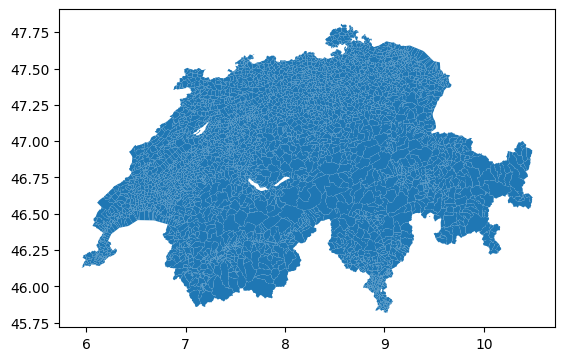

In [4]:
plt.figure(figsize=(20,20))
data['geometry'].plot()

<AxesSubplot: >

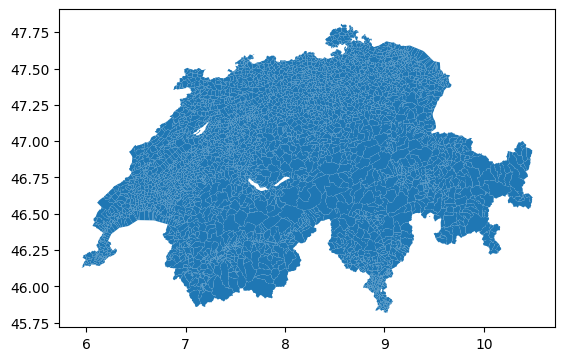

In [5]:
# Remove all data without geometry and other countries
data = data[data['geometry'].notna()]
# Check if didnt remove useful data
data['geometry'].plot()

In [6]:
data.head()

,rec_art,onrp,bfsnr,plz_typ,postleitzahl,plz_zz,gplz,ortbez18,ortbez27,kanton,sprachcode,sprachcode_abw,briefz_durch,gilt_ab_dat,plz_briefzust,plz_coff,geo_shape,geo_point_2d,geometry
4,01,125,5586,20,1000,25,1000,Lausanne 25,Lausanne 25,VD,2,None,130,1988-03-01,100060,J,None,"{'lon': 6.693988728873097, 'lat': 46.572641652...","POLYGON ((6.67378 46.56541, 6.67375 46.56540, ..."
7,01,151,5586,20,1004,00,1000,Lausanne,Lausanne,VD,2,None,130,1986-05-21,100060,J,None,"{'lon': 6.617832276043644, 'lat': 46.528902193...","POLYGON ((6.61195 46.54229, 6.61194 46.54229, ..."
8,01,153,5586,20,1006,00,1000,Lausanne,Lausanne,VD,2,None,130,1986-05-21,100060,J,None,"{'lon': 6.634896593365078, 'lat': 46.491182601...","POLYGON ((6.64062 46.45487, 6.64196 46.50480, ..."
9,01,154,5586,20,1007,00,1000,Lausanne,Lausanne,VD,2,None,130,1986-05-21,100060,J,None,"{'lon': 6.607034955328343, 'lat': 46.487980939...","POLYGON ((6.63512 46.45494, 6.62381 46.50580, ..."
10,01,157,5590,10,1009,00,1009,Pully,Pully,VD,2,None,130,1996-06-10,100060,J,None,"{'lon': 6.65573912466407, 'lat': 46.4883543119...","POLYGON ((6.65123 46.51363, 6.65115 46.51362, ..."


<AxesSubplot: >

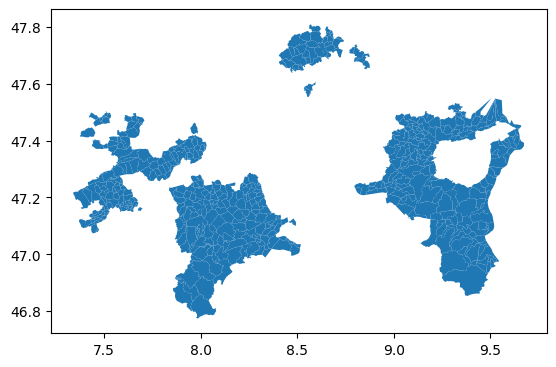

In [7]:
# Boundary test
data[data['kanton'].isin(['SO', 'SG', 'SH', 'LU'])]['geometry'].plot()

<AxesSubplot: >

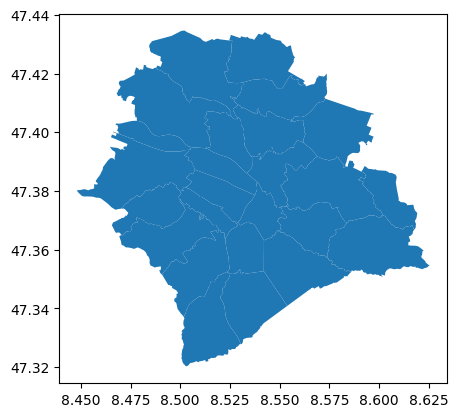

In [8]:
data[data['gplz'] == 8000].plot(legend=False)

In [9]:
data['gen_gplz'] = data['gplz'].div(100).astype(int).mul(100)

<AxesSubplot: >

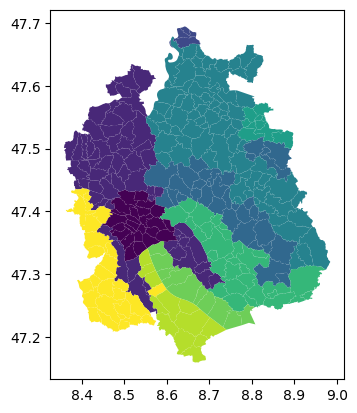

In [10]:
data[data['kanton'] == 'ZH'].plot('gen_gplz', legend=False)

<AxesSubplot: >

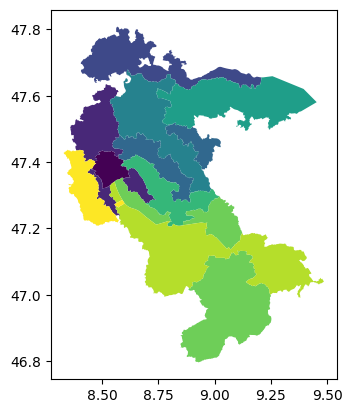

In [11]:
data_n = data.dissolve(by='gen_gplz').reset_index(drop = False)
data_n.query("8000 <= gen_gplz < 9000").plot("gen_gplz", legend=False)

<AxesSubplot: >

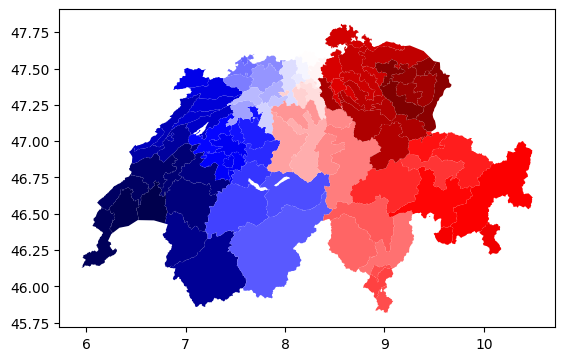

In [12]:
data_n.plot("gen_gplz", legend=False, cmap='seismic')

In [13]:
data_n.explore("gen_gplz", legend=False, tooltip='gen_gplz', cmap='seismic')

<AxesSubplot: >

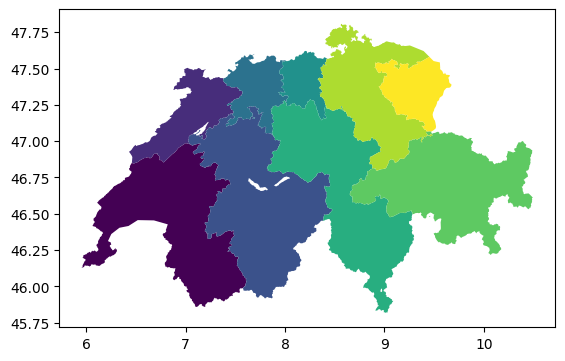

In [14]:
data['gen_gplz2'] = data['gplz'].div(1000).astype(int).mul(1000)
data_n2 = data.dissolve(by='gen_gplz2').reset_index(drop = False)
data_n2.plot("gen_gplz2")